## Data Analysis
### Run details:
+ NS_max_iter 10000000 
+ NS_sampling_efficiency 0.15
+ NS_evidence_tolerance 0.8
+ NS_n_live_points 1000 


In [2]:
#Show plots inline, and load main getdist plot module and samples class
from __future__ import print_function
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import sys, os
sys.path.insert(0,os.path.realpath(os.path.join(os.getcwd(),'..')))
from getdist import plots, MCSamples
import getdist, IPython
import pylab as plt
print('GetDist Version: %s, Matplotlib version: %s'%(getdist.__version__, plt.matplotlib.__version__))
#matplotlib 2 doesn't seem to work well without usetex on
plt.rcParams['text.usetex']=True

import numpy as np 

GetDist Version: 1.1.2, Matplotlib version: 3.3.2


In [3]:
planck1 = np.loadtxt('/home/zcapjru/Thesis_data/PLANCK/Planck_TTTEEE_lowl_lowE/base_plikHM_TTTEEE_lowl_lowE_post_zre6p5_1.txt')
planck2 = np.loadtxt('/home/zcapjru/Thesis_data/PLANCK/Planck_TTTEEE_lowl_lowE/base_plikHM_TTTEEE_lowl_lowE_post_zre6p5_2.txt')
planck3 = np.loadtxt('/home/zcapjru/Thesis_data/PLANCK/Planck_TTTEEE_lowl_lowE/base_plikHM_TTTEEE_lowl_lowE_post_zre6p5_3.txt')
planck4 = np.loadtxt('/home/zcapjru/Thesis_data/PLANCK/Planck_TTTEEE_lowl_lowE/base_plikHM_TTTEEE_lowl_lowE_post_zre6p5_4.txt')

planck_tot = np.concatenate((planck1, planck2, planck3, planck4), axis=0)
names_planck= np.loadtxt('/home/zcapjru/Thesis_data/PLANCK/Planck_TTTEEE_lowl_lowE/base_plikHM_TTTEEE_lowl_lowE_post_zre6p5.paramnames', dtype=np.str, usecols=[0])

In [4]:
#planck1 = np.loadtxt('/home/zcapjru/Thesis_data/FINAL_RESULTS/Final_final_results/Planck_chain/base_plikHM_TTTEEE_lowl_lowE_lensing_1.txt')
#planck2 = np.loadtxt('/home/zcapjru/Thesis_data/FINAL_RESULTS/Final_final_results/Planck_chain/base_plikHM_TTTEEE_lowl_lowE_lensing_2.txt')
#planck3 = np.loadtxt('/home/zcapjru/Thesis_data/FINAL_RESULTS/Final_final_results/Planck_chain/base_plikHM_TTTEEE_lowl_lowE_lensing_3.txt')
#planck4 = np.loadtxt('/home/zcapjru/Thesis_data/FINAL_RESULTS/Final_final_results/Planck_chain/base_plikHM_TTTEEE_lowl_lowE_lensing_4.txt')
#planck_tot = np.concatenate((planck1, planck2, planck3, planck4), axis=0)
#names_planck= np.loadtxt('/home/zcapjru/Thesis_data/FINAL_RESULTS/Final_final_results/Planck_chain/base_plikHM_TTTEEE_lowl_lowE_lensing.paramnames', dtype=np.str, usecols=[0])

In [5]:
labels_cmb = [  '\omega_{cdm}', 'ln10^{10}A_s', '\omega_{b}', 'n_{s}', 'h', 
           '\Omega_{m}', '\sigma_8', 'S_{8}']
names_cmb = [  'omega_cdm', 'ln10^10A_s',  'omega_b', 'n_s', 'h', 
           'Omega_m', 'sigma8', 'S8']

labels_kv = ['\omega_{cdm}', 'ln10^{10}A_{s}', '\omega_{b}', 'n_{s}', 'h', 'A_{IA}', 'c_{min}',
             'dc', '\Omega_{m}', '\sigma_8', 'S_{8}']
names_kv = ['omega_cdm', 'ln10^10A_s', 'omega_b', 'n_s', 'h', 'A_IA', 
'c_min', 'dc', 'Omega_m', 'sigma8', 'S8']

labels_kv_test = ['\omega_{cdm}', 'ln10^{10}A_{s}', '\omega_{b}', 'n_{s}', 'h', 'A_{IA}', 'c_{min}',
             'dc', '\Omega_{m}', '\sigma_8']
names_kv_test = ['omega_cdm', 'ln10^10A_s', 'omega_b', 'n_s', 'h', 'A_IA', 
'c_min', 'dc', 'Omega_m', 'sigma8']

names_planck = ['omega_cdm', 'omega_b', 'ln10^10A_s', 'n_s', 'h', 'Omega_m', 'sigma8', 'S8']
labels_planck = ['\omega_{cdm}', '\omega_b', '\ln10^{10}A_s', 'n_s', 'h', '\Omega_m', '\sigma_8', 'S_8']

In [6]:
planck = []
for item in planck_tot:
    planck.append([(item[29]/100)*(item[29]/100)*(item[31] - item[2]), item[2], item[6], item[7], item[29]/100, item[31], item[34], item[35]])
planck = np.array(planck)

# Load 1 cosmo 

In [7]:
#KV_ext_1cosmo = np.loadtxt('/home/zcapjru/Thesis_data/FINAL_RESULTS/Final_final_results/HildeBrandt/KV450_fiducial.txt')
KV_ext_1cosmo = np.loadtxt('Summer_Paper_2020/paper_results_analysis/1COSMO/kv_1cosmo/chain_NS__accepted.txt')
#KV_ext_1cosmo = np.loadtxt('Summer_Paper_2020/paper_results_analysis/1COSMO/chain_NS__accepted.txt')
#KVSS_ext_1cosmo = np.loadtxt('/home/zcapjru/Thesis_data/FINAL_RESULTS/Final_final_results/kvss_1cosmo_13_01/chain_NS__accepted.txt')
KVSS_ext_1cosmo = np.loadtxt('Summer_Paper_2020/paper_results_analysis/1COSMO/kvss_1csm/chain_NS__accepted.txt')
KVSS_lym_1cosmo = np.loadtxt('Summer_Paper_2020/paper_results_analysis/eBOSS/1COSMO/kvss_lym_1csm/chain_NS__accepted.txt')
KVSS_lym_CMB_1cosmo = np.loadtxt('Summer_Paper_2020/paper_results_analysis/eBOSS/1COSMO/kvss_lymCMB_1csm/chain_NS__accepted.txt')

KV_cmb_1cosmo = np.loadtxt('Summer_Paper_2020/paper_results_analysis/1COSMO/kv_cmb_1cms/chain_NS__accepted.txt')
KV_lym_1cosmo = np.loadtxt('Summer_Paper_2020/paper_results_analysis/eBOSS/1COSMO/kv_lym_1csm/chain_NS__accepted.txt')
KV_lym_CMB_1cosmo = np.loadtxt('Summer_Paper_2020/paper_results_analysis/eBOSS/1COSMO/kv_lymcmb_1csm/chain_NS__accepted.txt')


In [8]:
#CMB nolog prior
CMB_nolg_1cosmo = np.loadtxt('Summer_Paper_2020/paper_results_analysis/1COSMO/CMB_nolg_1cosmo/chain_NS__accepted.txt')
#BOSS
BOSS_1cosmo = np.loadtxt('Summer_Paper_2020/paper_results_analysis/1COSMO/BOSS_test/chain_NS__accepted.txt')
#lym12
LYM_1cosmo = np.loadtxt('Summer_Paper_2020/paper_results_analysis/1COSMO/lym_1csm/chain_NS__accepted.txt')
#lym14
LYM14_1cosmo = np.loadtxt('Summer_Paper_2020/paper_results_analysis/1COSMO/lym14_1csm/chain_NS__accepted.txt')

In [9]:
#KV 1cosmo
kv_1cosmo = []
for item in KV_ext_1cosmo:
    kv_1cosmo.append([item[2], item[3], item[4], item[5], item[6], item[7], item[8], item[9],
                           item[-2], item[-1], item[-1]*np.sqrt(item[-2]/.3)])
kv_1cosmo = np.array(kv_1cosmo)


#KVSS 1cosmo
kvss_1cosmo = []
for item in KVSS_ext_1cosmo:
    kvss_1cosmo.append([item[2], item[3], item[4], item[5], item[6], item[7], item[8], item[9],
                          item[-2], item[-1], item[-1]*np.sqrt(item[-2]/.3)])
kvss_1cosmo = np.array(kvss_1cosmo)

#KVSS lyman 1cosmo
kvss_lym_1cosmo = []
for item in KVSS_lym_1cosmo:
    kvss_lym_1cosmo.append([item[2], item[3], item[4], item[5], item[6], item[7], item[8], item[9],
                           item[-7], item[-6], item[-6]*np.sqrt(item[-7]/.3)])
kvss_lym_1cosmo = np.array(kvss_lym_1cosmo)

#KVSS Lyman CMB 1cosmo
kvss_lyman_cmb_1cosmo = []
for item in KVSS_lym_CMB_1cosmo:
    kvss_lyman_cmb_1cosmo.append([item[2], item[3], item[4], item[5], item[6], item[7], item[8], item[9],
                           item[-2], item[-1], item[-1]*np.sqrt(item[-2]/.3)])
kvss_lyman_cmb_1cosmo = np.array(kvss_lyman_cmb_1cosmo)

#KV CMB 1cosmo
kv_cmb_1cosmo = []
for item in KV_cmb_1cosmo:
    kv_cmb_1cosmo.append([item[2], item[3], item[4], item[5], item[6], item[7], item[8], item[9],
                          item[-2], item[-1], item[-1]*np.sqrt(item[-2]/.3)])
kv_cmb_1cosmo = np.array(kv_cmb_1cosmo)

#KV lyman 1cosmo
kv_lym_1cosmo = []
for item in KV_lym_1cosmo:
    kv_lym_1cosmo.append([item[2], item[3], item[4], item[5], item[6], item[7], item[8], item[9],
                           item[-7], item[-6], item[-6]*np.sqrt(item[-7]/.3)])
kv_lym_1cosmo = np.array(kv_lym_1cosmo)

#KV Lyman CMB 1cosmo
#dz and omg_m and sig8 got mixed
kv_lym_cmb_1cosmo = []
for item in KV_lym_CMB_1cosmo:
    kv_lym_cmb_1cosmo.append([item[2], item[3], item[4], item[5], item[6], item[7], item[8], item[9],
                           item[11], item[12], item[12]*np.sqrt(item[11]/.3)])
kv_lym_cmb_1cosmo = np.array(kv_lym_cmb_1cosmo)


In [10]:
#CMB
cmb_nolg_1cosmo = []
for item in CMB_nolg_1cosmo:
    cmb_nolg_1cosmo.append([ item[2], item[3], item[4], item[5], item[6],item[-2], item[-1], item[-1]*np.sqrt(item[-2]/.3)])
cmb_nolg_1cosmo = np.array(cmb_nolg_1cosmo)

#BOSS
boss_1cosmo = []
for item in BOSS_1cosmo:
    boss_1cosmo.append([ item[2], item[3], item[4], item[5], item[6],item[-2], item[-1], item[-1]*np.sqrt(item[-2]/.3)])
boss_1cosmo = np.array(boss_1cosmo)

#lyman 1cosmo
lym_1cosmo = []
for item in LYM_1cosmo:
    lym_1cosmo.append([item[2], item[3], item[4], item[5], item[6],item[-2], item[-1], item[-1]*np.sqrt(item[-2]/.3)])
lym_1cosmo = np.array(lym_1cosmo)

#lyman14 1cosmo
lym14_1cosmo = []
for item in LYM14_1cosmo:
    lym14_1cosmo.append([item[2], item[3], item[4], item[5], item[6],item[-2], item[-1], item[-1]*np.sqrt(item[-2]/.3)])
lym14_1cosmo = np.array(lym14_1cosmo)

# Load 2 cosmo 

In [11]:
#KV
#KV_ext = np.loadtxt('/home/zcapjru/Thesis_data/FINAL_RESULTS/Final_final_results/kv_ext_2cosmo/chain_NS__accepted.txt')
KV_ext = np.loadtxt('Paper_results/paper_results_analysis/2COSMOS/kv_2cosmo/chain_NS__accepted.txt')
#KVSS
KVSS_DR10 = np.loadtxt('Final_final_results/kvss_ext_12_12/chain_NS__accepted.txt')
#KV mark3
KV_mark3 = np.loadtxt('Summer_Paper_2020/paper_results_analysis/2COSMOS/kv_mark3/chain_NS__accepted.txt')
#KVSS mark3
KVSS_mark3 = np.loadtxt('Summer_Paper_2020/paper_results_analysis/2COSMOS/kvss_mark3/chain_NS__accepted.txt')
#KVSS lyman mark3
KVSS_lym_mark3 = np.loadtxt('Summer_Paper_2020/paper_results_analysis/2COSMOS/kvss_lym/chain_NS__accepted.txt')
#KVSS lyman CMB mark3
KVSS_lym_CMB_mark3 = np.loadtxt('Summer_Paper_2020/paper_results_analysis/2COSMOS/kvss_lym_CMB/chain_NS__accepted.txt')

#KV cmb
KV_cmb = np.loadtxt('Summer_Paper_2020/paper_results_analysis/2COSMOS/kv_cmb/chain_NS__accepted.txt')
#KV lyman
KV_lym = np.loadtxt('Summer_Paper_2020/paper_results_analysis/eBOSS/2COSMOS/kv_lyman/chain_NS__accepted.txt')
#KV lyman CMB 
KV_lym_CMB = np.loadtxt('Summer_Paper_2020/paper_results_analysis/eBOSS/2COSMOS/kv_lym_cmb/chain_NS__accepted.txt')



In [12]:
#KV 2cosmo
kv_ext_gro = []
kv_ext_geo = []
for item in KV_ext:
    kv_ext_gro.append([item[2], item[3], item[4], item[5], item[6], item[12], item[14], item[16], 
                      item[23], item[24], item[24]*np.sqrt(item[23]/.3)])
    kv_ext_geo.append([item[7], item[8], item[9], item[10], item[11], item[13], item[15], item[17],
                      item[25], item[26], item[26]*np.sqrt(item[25]/.3)])
kv_ext_gro = np.array(kv_ext_gro)
kv_ext_geo = np.array(kv_ext_geo)

In [13]:
#KVSS_2cosmo
kvss_ext_gro = []
kvss_ext_geo = []
for item in KVSS_DR10:
    kvss_ext_gro.append([item[2], item[3], item[4], item[5], item[6], item[12], item[14], item[16], 
                      item[23], item[24], item[24]*np.sqrt(item[23]/.3)])
    kvss_ext_geo.append([item[7], item[8], item[9], item[10], item[11], item[13], item[15], item[17],
                      item[25], item[26], item[26]*np.sqrt(item[25]/.3)])
kvss_ext_gro = np.array(kvss_ext_gro)
kvss_ext_geo = np.array(kvss_ext_geo)

In [14]:
#KV mark3
kv_mark3_gro = []
kv_mark3_geo = []
for item in KV_mark3:
    kv_mark3_gro.append([item[2], item[3], item[4], item[5], item[6], item[12], item[14], item[16], 
                      item[23], item[24], item[24]*np.sqrt(item[23]/.3)])
    kv_mark3_geo.append([item[7], item[8], item[9], item[10], item[11], item[13], item[15], item[17],
                      item[25], item[26], item[26]*np.sqrt(item[25]/.3)])
kv_mark3_gro = np.array(kv_mark3_gro)
kv_mark3_geo = np.array(kv_mark3_geo)

In [15]:
#KV lym
kv_lym_gro = []
kv_lym_geo = []
for item in KV_lym:
    kv_lym_gro.append([item[2], item[3], item[4], item[5], item[6], item[12], item[14], item[16], 
                      item[23], item[24], item[24]*np.sqrt(item[23]/.3)])
    kv_lym_geo.append([item[7], item[8], item[9], item[10], item[11], item[13], item[15], item[17],
                      item[25], item[26], item[26]*np.sqrt(item[25]/.3)])
kv_lym_gro = np.array(kv_lym_gro)
kv_lym_geo = np.array(kv_lym_geo)

In [16]:
#KV cmb
kv_cmb_gro = []
kv_cmb_geo = []
for item in KV_cmb:
    kv_cmb_gro.append([item[2], item[3], item[4], item[5], item[6], item[12], item[14], item[16], 
                      item[23], item[24], item[24]*np.sqrt(item[23]/.3)])
    kv_cmb_geo.append([item[7], item[8], item[9], item[10], item[11], item[13], item[15], item[17],
                      item[25], item[26], item[26]*np.sqrt(item[25]/.3)])
kv_cmb_gro = np.array(kv_cmb_gro)
kv_cmb_geo = np.array(kv_cmb_geo)

In [17]:
#KV lym cmb
kv_lymcmb_gro = []
kv_lymcmb_geo = []
for item in KV_lym_CMB:
    kv_lymcmb_gro.append([item[2], item[3], item[4], item[5], item[6], item[12], item[14], item[16], 
                      item[23], item[24], item[24]*np.sqrt(item[23]/.3)])
    kv_lymcmb_geo.append([item[7], item[8], item[9], item[10], item[11], item[13], item[15], item[17],
                      item[25], item[26], item[26]*np.sqrt(item[25]/.3)])
kv_lymcmb_gro = np.array(kv_lymcmb_gro)
kv_lymcmb_geo = np.array(kv_lymcmb_geo)

In [18]:
#KVSS mark3
kvss_mark3_gro = []
kvss_mark3_geo = []
for item in KVSS_mark3:
    kvss_mark3_gro.append([item[2], item[3], item[4], item[5], item[6], item[12], item[14], item[16], 
                      item[23], item[24], item[24]*np.sqrt(item[23]/.3)])
    kvss_mark3_geo.append([item[7], item[8], item[9], item[10], item[11], item[13], item[15], item[17],
                      item[25], item[26], item[26]*np.sqrt(item[25]/.3)])
kvss_mark3_gro = np.array(kvss_mark3_gro)
kvss_mark3_geo = np.array(kvss_mark3_geo)

In [19]:
#KVSS lym mark3
kvss_lym_mark3_gro = []
kvss_lym_mark3_geo = []
for item in KVSS_lym_mark3:
    kvss_lym_mark3_gro.append([item[2], item[3], item[4], item[5], item[6], item[12], item[14], item[16], 
                      item[23], item[24], item[24]*np.sqrt(item[23]/.3)])
    kvss_lym_mark3_geo.append([item[7], item[8], item[9], item[10], item[11], item[13], item[15], item[17],
                      item[25], item[26], item[26]*np.sqrt(item[25]/.3)])
kvss_lym_mark3_gro = np.array(kvss_lym_mark3_gro)
kvss_lym_mark3_geo = np.array(kvss_lym_mark3_geo)

In [20]:
#KVSS lym CMB mark3
kvss_lym_CMB_mark3_gro = []
kvss_lym_CMB_mark3_geo = []
for item in KVSS_lym_CMB_mark3:
    kvss_lym_CMB_mark3_gro.append([item[2], item[3], item[4], item[5], item[6], item[12], item[14], item[16], 
                      item[23], item[24], item[24]*np.sqrt(item[23]/.3)])
    kvss_lym_CMB_mark3_geo.append([item[7], item[8], item[9], item[10], item[11], item[13], item[15], item[17],
                      item[25], item[26], item[26]*np.sqrt(item[25]/.3)])
kvss_lym_CMB_mark3_gro = np.array(kvss_lym_CMB_mark3_gro)
kvss_lym_CMB_mark3_geo = np.array(kvss_lym_CMB_mark3_geo)

## Preparing Samples

In [21]:
KV_getdist = MCSamples(samples= kv_1cosmo, names = names_kv, labels = labels_kv, 
                     label = 'WL', weights = np.transpose(KV_ext_1cosmo)[0],loglikes = np.transpose(KV_ext_1cosmo)[1])
KVSS_getdist = MCSamples(samples= kvss_1cosmo, names = names_kv, labels = labels_kv, 
                     label = 'WL+Clustering', weights = np.transpose(KVSS_ext_1cosmo)[0],loglikes = np.transpose(KVSS_ext_1cosmo)[1])
KVSS_lym_getdist = MCSamples(samples= kvss_lym_1cosmo, names = names_kv, labels = labels_kv, 
                     label = 'WL+BOSS+Lya', weights = np.transpose(KVSS_lym_1cosmo)[0],loglikes = np.transpose(KVSS_lym_1cosmo)[1])
KVSS_lym_cmb_getdist = MCSamples(samples= kvss_lyman_cmb_1cosmo, names = names_kv, labels = labels_kv, 
                     label = 'WL+BOSS+Lya+CMB', weights = np.transpose(KVSS_lym_CMB_1cosmo)[0],loglikes = np.transpose(KVSS_lym_CMB_1cosmo)[1])

KV_cmb_getdist = MCSamples(samples= kv_cmb_1cosmo, names = names_kv, labels = labels_kv, 
                     label = 'WL+CMB', weights = np.transpose(KV_cmb_1cosmo)[0],
                           loglikes = np.transpose(KV_cmb_1cosmo)[1])
KV_lym_getdist = MCSamples(samples= kv_lym_1cosmo, names = names_kv, labels = labels_kv, 
                     label = 'WL+Lya', weights = np.transpose(KV_lym_1cosmo)[0],
                           loglikes = np.transpose(KV_lym_1cosmo)[1])
KV_lym_cmb_getdist = MCSamples(samples= kv_lym_cmb_1cosmo, names = names_kv, labels = labels_kv, 
                     label = 'WL+Lya+CMB', weights = np.transpose(KV_lym_CMB_1cosmo)[0],
                               loglikes = np.transpose(KV_lym_CMB_1cosmo)[1])

KV_gro_getdist = MCSamples(samples= kv_ext_gro, names = names_kv, labels = labels_kv, 
                     label = 'WL gro', weights = np.transpose(KV_ext)[0],loglikes = np.transpose(KV_ext)[1])
KV_geo_getdist = MCSamples(samples= kv_ext_geo, names = names_kv, labels = labels_kv, 
                     label = 'WL geo', weights = np.transpose(KV_ext)[0],loglikes = np.transpose(KV_ext)[1])
KVSS_gro_getdist = MCSamples(samples= kvss_ext_gro, names = names_kv, labels = labels_kv, 
                     label = 'WL+Clustering gro', weights = np.transpose(KVSS_DR10)[0],loglikes = np.transpose(KVSS_DR10)[1])
KVSS_geo_getdist = MCSamples(samples= kvss_ext_geo, names = names_kv, labels = labels_kv, 
                     label = 'WL+Clustering geo', weights = np.transpose(KVSS_DR10)[0],loglikes = np.transpose(KVSS_DR10)[1])
###
KV_mark3_gro_getdist = MCSamples(samples= kv_mark3_gro, names = names_kv, labels = labels_kv, 
                     label = 'WL gro', weights = np.transpose(KV_mark3)[0],loglikes = np.transpose(KV_mark3)[1])
KV_mark3_geo_getdist = MCSamples(samples= kv_mark3_geo, names = names_kv, labels = labels_kv, 
                     label = 'WL geo', weights = np.transpose(KV_mark3)[0],loglikes = np.transpose(KV_mark3)[1])
KVSS_mark3_gro_getdist = MCSamples(samples= kvss_mark3_gro, names = names_kv, labels = labels_kv, 
                     label = 'WL+Clustering Gro', weights = np.transpose(KVSS_mark3)[0],loglikes = np.transpose(KVSS_mark3)[1])
KVSS_mark3_geo_getdist = MCSamples(samples= kvss_mark3_geo, names = names_kv, labels = labels_kv, 
                     label = 'WL+Clustering Geo', weights = np.transpose(KVSS_mark3)[0],loglikes = np.transpose(KVSS_mark3)[1])
KVSS_lym_mark3_gro_getdist = MCSamples(samples= kvss_lym_mark3_gro, names = names_kv, labels = labels_kv, 
                    label = 'WL+Clustering+Lya Gro', weights = np.transpose(KVSS_lym_mark3)[0],
                                       loglikes = np.transpose(KVSS_lym_mark3)[1])
KVSS_lym_mark3_geo_getdist = MCSamples(samples= kvss_lym_mark3_geo, names = names_kv, labels = labels_kv, 
                   label = 'WL+Clustering+Lya Geo', weights = np.transpose(KVSS_lym_mark3)[0],
                                      loglikes = np.transpose(KVSS_lym_mark3)[1])
KVSS_lym_CMB_mark3_gro_getdist = MCSamples(samples= kvss_lym_CMB_mark3_gro, names = names_kv, labels = labels_kv, 
                    label = 'WL+Clustering+Lya+CMB Gro', weights = np.transpose(KVSS_lym_CMB_mark3)[0],
                                       loglikes = np.transpose(KVSS_lym_CMB_mark3)[1])
KVSS_lym_CMB_mark3_geo_getdist = MCSamples(samples= kvss_lym_CMB_mark3_geo, names = names_kv, labels = labels_kv, 
                   label = 'WL+Clustering+Lya+CMB Geo', weights = np.transpose(KVSS_lym_CMB_mark3)[0],
                                      loglikes = np.transpose(KVSS_lym_CMB_mark3)[1])
###
KV_cmb_gro_getdist = MCSamples(samples= kv_cmb_gro, names = names_kv, labels = labels_kv, 
                     label = 'WL+CMB gro', weights = np.transpose(KV_cmb)[0],
                               loglikes = np.transpose(KV_cmb)[1])
KV_cmb_geo_getdist = MCSamples(samples= kv_cmb_geo, names = names_kv, labels = labels_kv, 
                     label = 'WL+CMB geo', weights = np.transpose(KV_cmb)[0],
                               loglikes = np.transpose(KV_cmb)[1])

KV_lym_gro_getdist = MCSamples(samples= kv_lym_gro, names = names_kv, labels = labels_kv, 
                     label = 'WL+Lya Gro', weights = np.transpose(KV_lym)[0],
                               loglikes = np.transpose(KV_lym)[1])
KV_lym_geo_getdist = MCSamples(samples= kv_lym_geo, names = names_kv, labels = labels_kv, 
                     label = 'WL+Lya Geo', weights = np.transpose(KV_lym)[0],
                               loglikes = np.transpose(KV_lym)[1])

KV_lymcmb_gro_getdist = MCSamples(samples= kv_lymcmb_gro, names = names_kv, labels = labels_kv, 
                    label = 'WL+Lya+CMB Gro', weights = np.transpose(KV_lym_CMB)[0],
                                       loglikes = np.transpose(KV_lym_CMB)[1])
KV_lymcmb_geo_getdist = MCSamples(samples= kv_lymcmb_geo, names = names_kv, labels = labels_kv, 
                   label = 'WL+Lya+CMB Geo', weights = np.transpose(KV_lym_CMB)[0],
                                      loglikes = np.transpose(KV_lym_CMB)[1])
###
CMB_nolg_getdist = MCSamples(samples= cmb_nolg_1cosmo, names = names_cmb, labels = labels_cmb, 
                     label = 'CMB', weights = np.transpose(CMB_nolg_1cosmo)[0],
                                         loglikes = np.transpose(CMB_nolg_1cosmo)[1])
BOSS_getdist = MCSamples(samples= boss_1cosmo, names = names_cmb, labels = labels_cmb, 
                     label = 'Clustering', weights = np.transpose(BOSS_1cosmo)[0],
                                         loglikes = np.transpose(BOSS_1cosmo)[1])
lym_getdist = MCSamples(samples= lym_1cosmo, names = names_cmb, labels = labels_cmb, 
                     label = 'Lya DR12', weights = np.transpose(LYM_1cosmo)[0],
                                         loglikes = np.transpose(LYM_1cosmo)[1])
lym14_getdist = MCSamples(samples= lym14_1cosmo, names = names_cmb, labels = labels_cmb, 
                     label = 'Lya', weights = np.transpose(LYM14_1cosmo)[0],
                                         loglikes = np.transpose(LYM14_1cosmo)[1])
###
planck_getdist= MCSamples(samples=planck, names = names_planck, labels = labels_planck, label= 'Planck 2018',
                    weights=np.transpose(planck_tot)[0],loglikes=np.transpose(planck_tot)[1])

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


# Lym

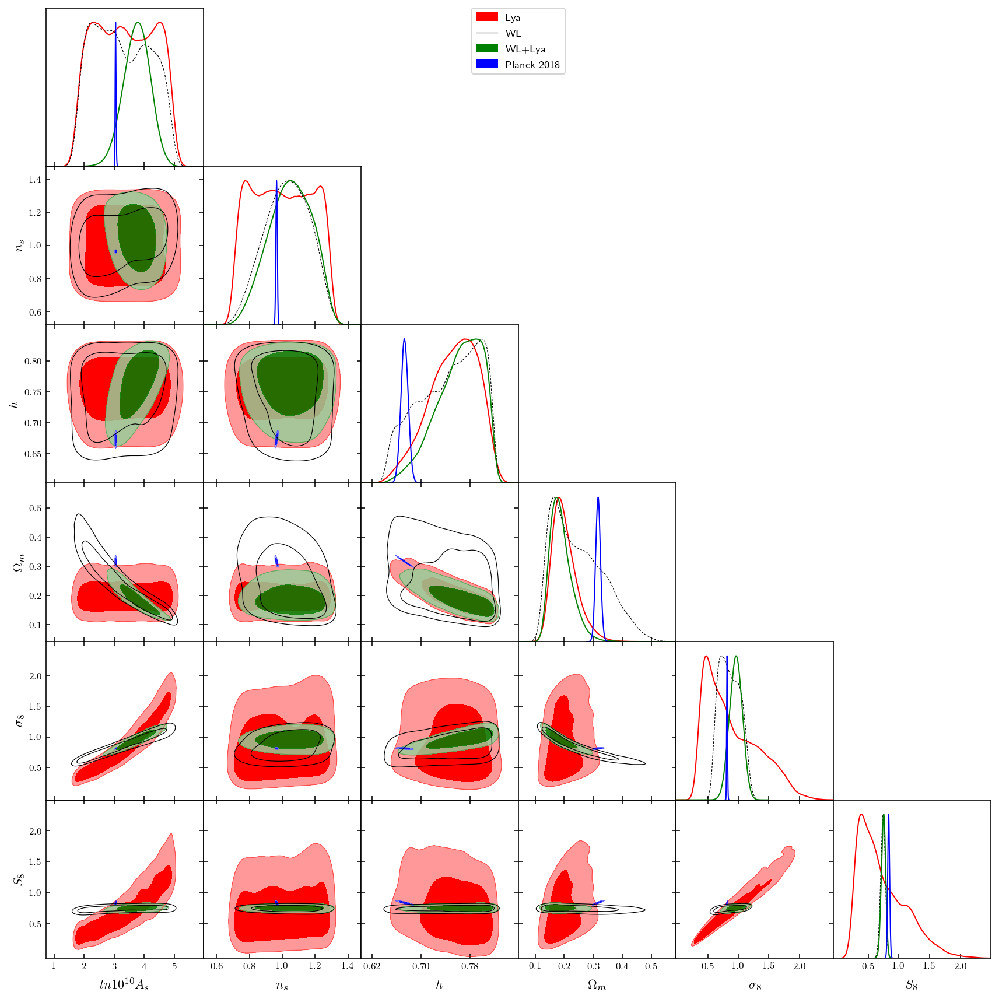

In [21]:
g = plots.getSubplotPlotter()
g.triangle_plot([ lym14_getdist,  KV_getdist, KV_lym_getdist, planck_getdist], [ 'ln10^10A_s', 'n_s', 'h', 'Omega_m', 'sigma8', 'S8'],
                line_args=[ {'lw':1, 'color':'red'}, {'ls':'--', 'color':'black'},
               {'lw':1, 'color':'green'}, {'lw':1, 'color':'blue'}], 
    contour_colors=['red', 'black', 'green', 'blue']
                , filled=[ True, False, True, True])

#'ln10^10A_s', 'n_s', 'h',

# BOSS

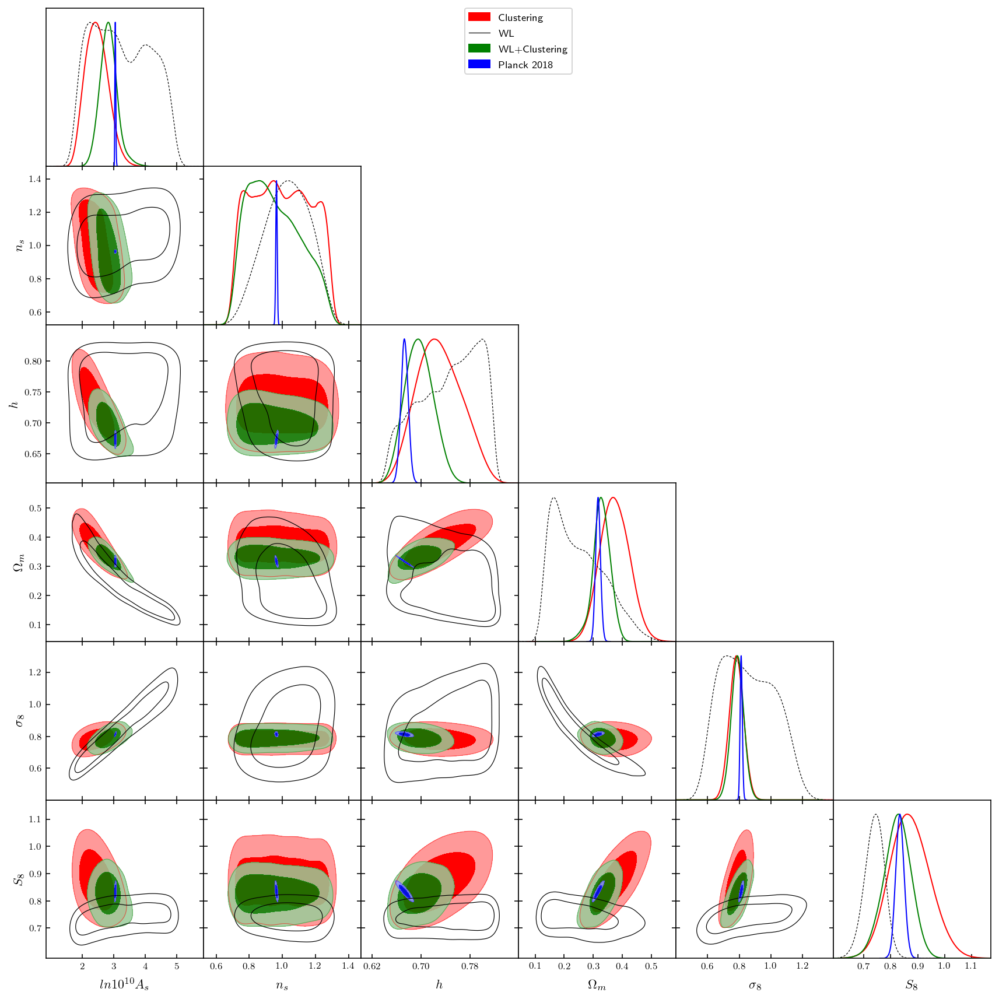

In [22]:
g = plots.getSubplotPlotter()
g.triangle_plot([ BOSS_getdist,  KV_getdist, KVSS_getdist, planck_getdist], [ 'ln10^10A_s', 'n_s', 'h', 'Omega_m', 'sigma8', 'S8'],
                line_args=[ {'lw':1, 'color':'red'}, {'ls':'--', 'color':'black'},
               {'lw':1, 'color':'green'}, {'lw':1, 'color':'blue'}], 
    contour_colors=['red', 'black', 'green', 'blue']
                , filled=[True, False, True, True])

#'ln10^10A_s', 'n_s', 'h',

# CMB

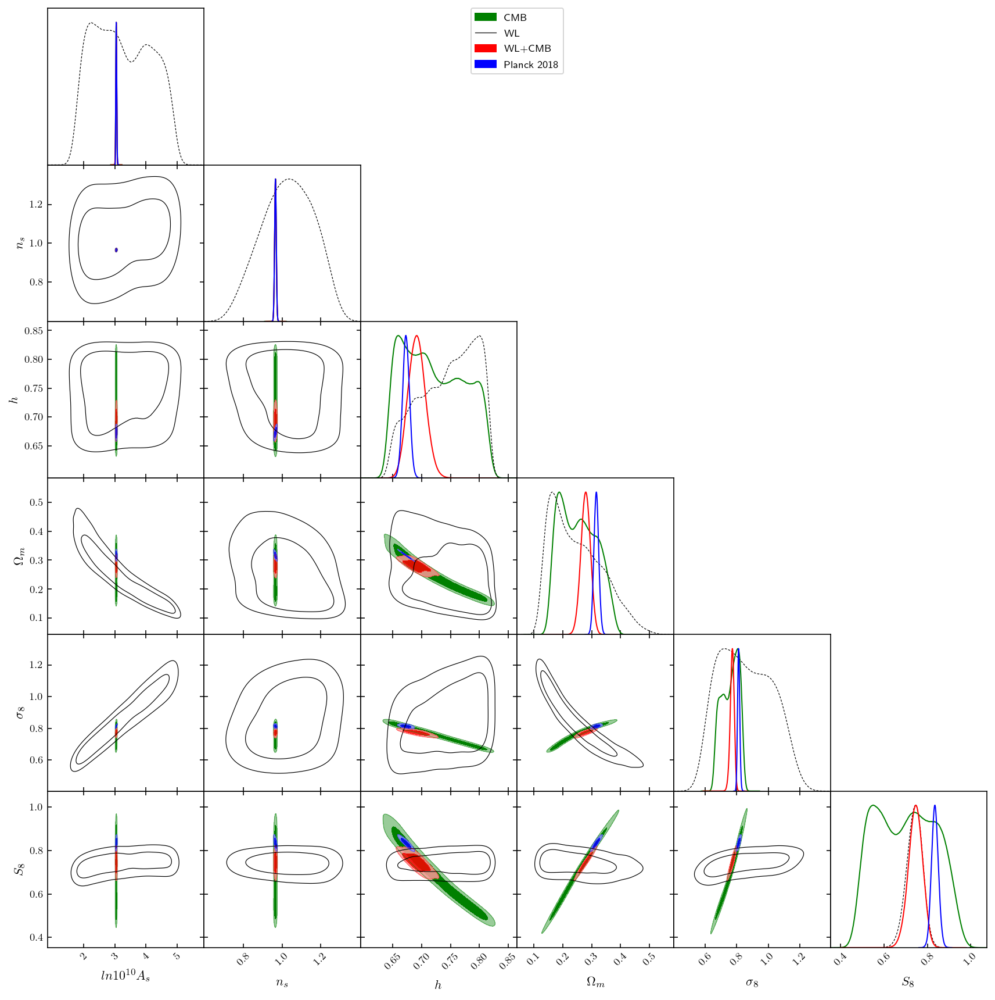

In [23]:
g = plots.getSubplotPlotter()
g.settings.axes_fontsize=12
g.settings.axis_tick_x_rotation=45
g.triangle_plot([ CMB_nolg_getdist,  KV_getdist, KV_cmb_getdist, planck_getdist], ['ln10^10A_s', 'n_s', 'h', 'Omega_m', 'sigma8', 'S8'],
                line_args=[ {'lw':1, 'color':'green'}, {'ls':'--', 'color':'black'},
               {'lw':1, 'color':'red'}, {'lw':1, 'color':'blue'}], 
    contour_colors=['green', 'black', 'red', 'blue']
                , filled=[True, False, True, True])
#First failed attempt to update BOSS lkls

# KV450

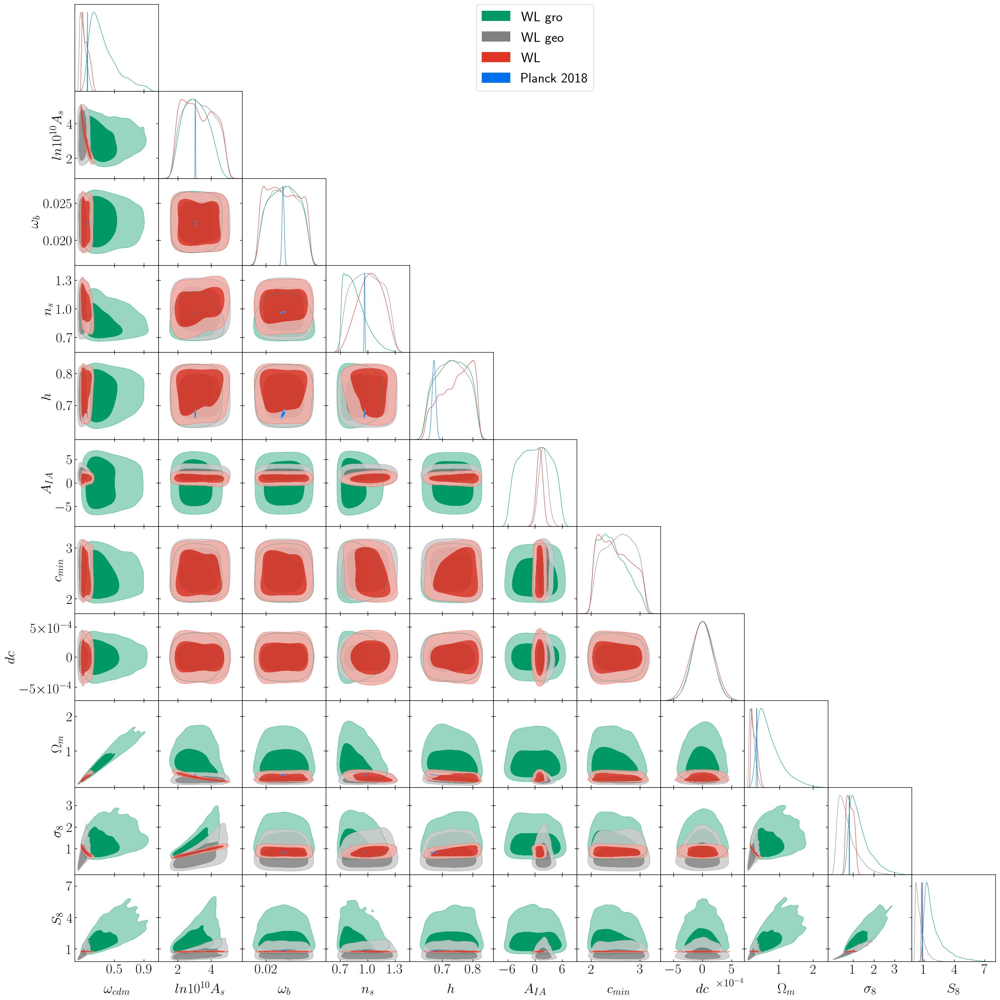

In [28]:
g = plots.getSubplotPlotter()
g.settings.axes_fontsize = 25
g.settings.legend_fontsize = 25
g.settings.axes_labelsize = 25
g.triangle_plot([KV_mark3_gro_getdist, KV_mark3_geo_getdist, KV_getdist, planck_getdist],
                filled=True)
#[ 'ln10^10A_s', 'n_s', 'h',  'Omega_m', 'sigma8', 'S8'],

In [25]:
g.plot_2d([KV_mark3_gro_getdist, KV_mark3_geo_getdist, KV_getdist, planck_getdist], 'Omega_m', 'sigma8', filled=True, lims=[0.05, 0.8, 0.5, 1.8])
g.add_legend(['KV450 Gro', 'KV450 Geo', 'KV450', 'P.18'], legend_loc='upper right');

In [26]:
g.plot_2d([KV_mark3_gro_getdist, KV_mark3_geo_getdist, KV_getdist, planck_getdist],  'sigma8', 'S8', filled=True, lims=[0.4, 1.3, 0.5, 1.22])
g.add_legend(['KV450 Gro', 'KV450 Geo', 'KV450', 'P.18'], legend_loc='upper left');

# KV + Lym

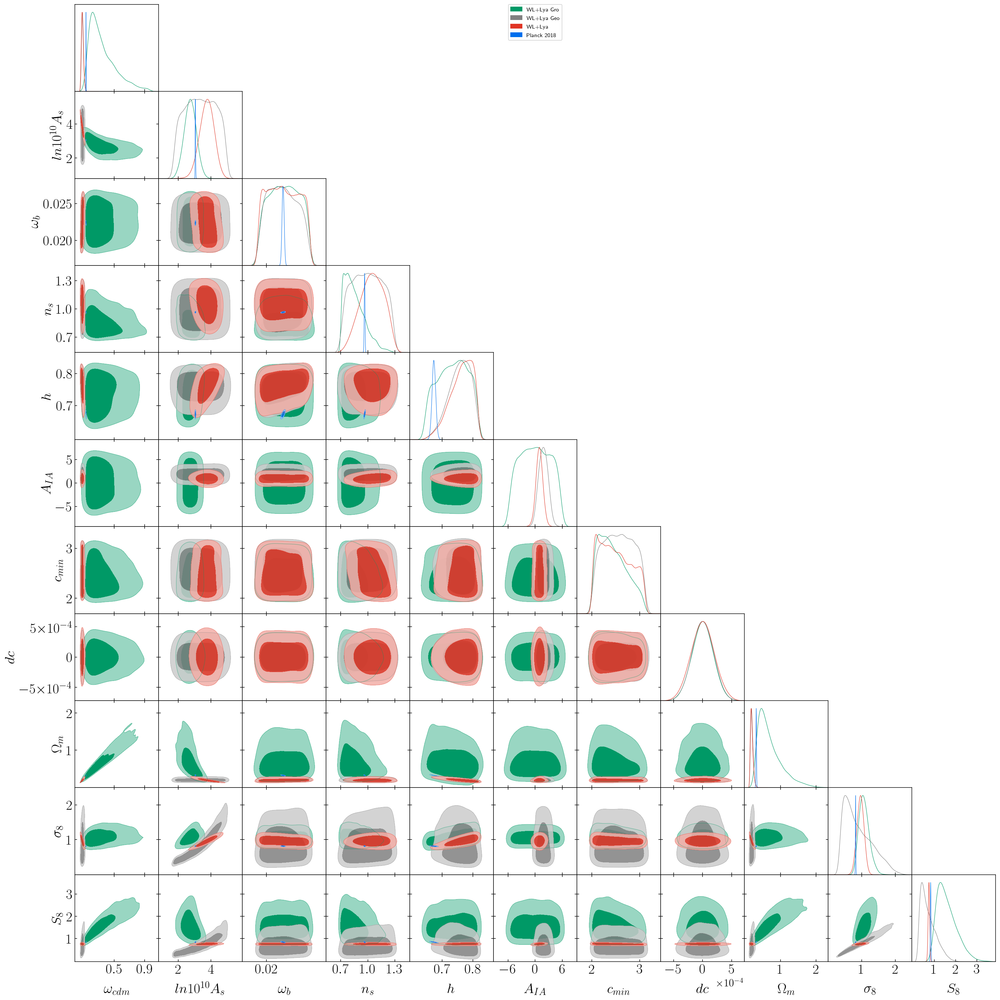

In [24]:
g = plots.getSubplotPlotter()
g.settings.axes_fontsize = 25
g.settings.axes_labelsize = 25
g.triangle_plot([KV_lym_gro_getdist, KV_lym_geo_getdist, KV_lym_getdist, planck_getdist],  filled=True)
#[ 'ln10^10A_s', 'n_s', 'h',  'Omega_m', 'sigma8', 'S8'],

In [28]:
g.plot_2d([KV_lym_gro_getdist, KV_lym_geo_getdist, KV_lym_getdist, planck_getdist], 'h', 'Omega_m', filled=True, lims=[0.65, 1, 0.05, .3])
g.add_legend(['KV+Lym Gro', 'KV+Lym Geo', 'KV+Lym', 'P.18'], legend_loc='upper right');

In [29]:
g.plot_2d([KV_lym_gro_getdist, KV_lym_geo_getdist, KV_lym_getdist, planck_getdist], 'Omega_m', 'sigma8', filled=True, lims=[0.05, 0.8, 0.5, 1.8])
g.add_legend(['KV+Lym Gro', 'KV+Lym Geo', 'KV+Lym', 'P.18'], legend_loc='upper right');

In [30]:
g.plot_2d([KV_lym_gro_getdist, KV_lym_geo_getdist, KV_lym_getdist, planck_getdist],  'h', 'sigma8',  filled=True)
g.add_legend(['KV+Lym Gro', 'KV+Lym Geo', 'KV+Lym', 'P.18'], legend_loc='upper left');

# KV + CMB 

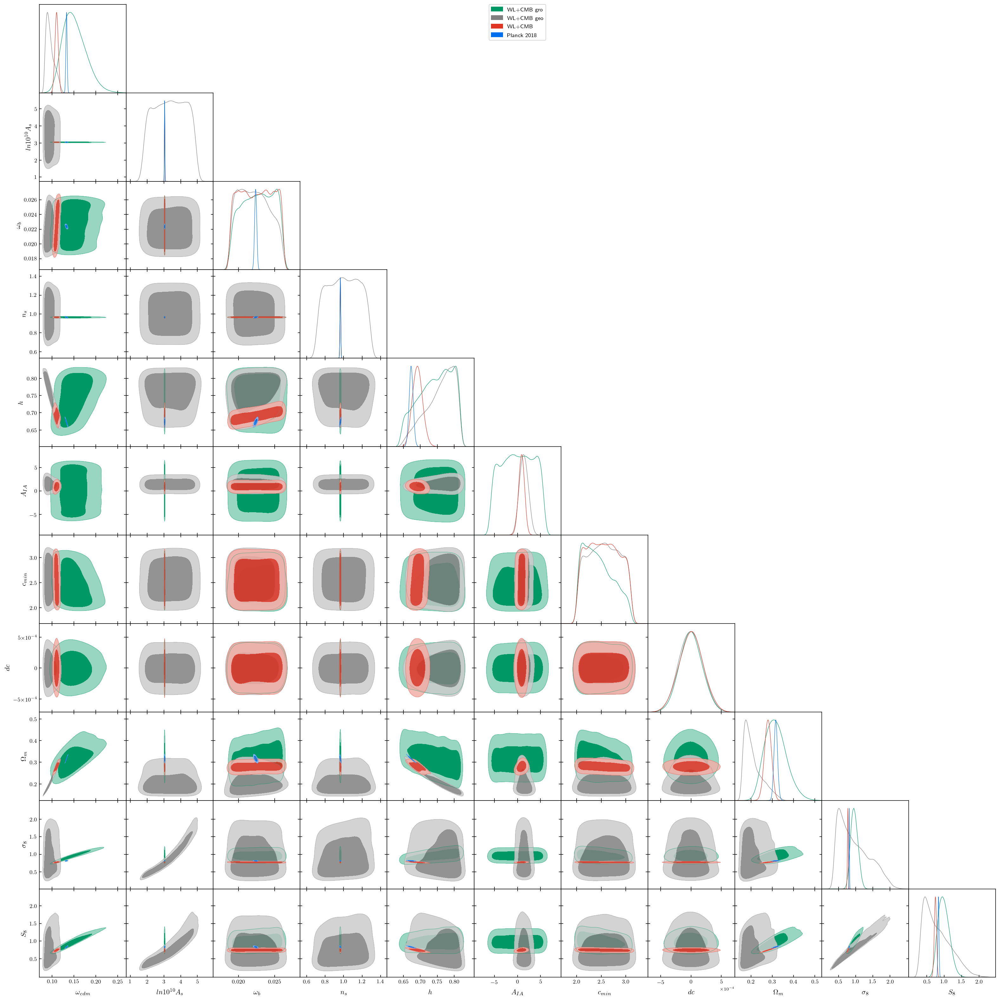

In [31]:
g = plots.getSubplotPlotter()
g.settings.axes_fontsize=12
g.triangle_plot([KV_cmb_gro_getdist, KV_cmb_geo_getdist, KV_cmb_getdist, planck_getdist], filled=True)
#[ 'ln10^10A_s', 'n_s', 'h',  'Omega_m', 'sigma8', 'S8'],

In [32]:
g.plot_2d([KV_cmb_gro_getdist, KV_cmb_geo_getdist, KV_cmb_getdist, planck_getdist], 'Omega_m', 'sigma8', filled=True, lims=[0.1, 0.6, 0.5, 1.3])
g.add_legend(['KV+CMB Gro', 'KV+CMB Geo', 'KV+CMB', 'P.18'], legend_loc='upper right');

In [33]:
g.plot_2d([KV_cmb_gro_getdist, KV_cmb_geo_getdist, KV_cmb_getdist, planck_getdist],  'sigma8', 'S8', filled=True, lims=[0.4, 1.45, 0.5, 1.22])
g.add_legend(['KV+CMB Gro', 'KV+CMB Geo', 'KV+CMB', 'P.18'], legend_loc='upper left');

# KV + Lym + CMB 

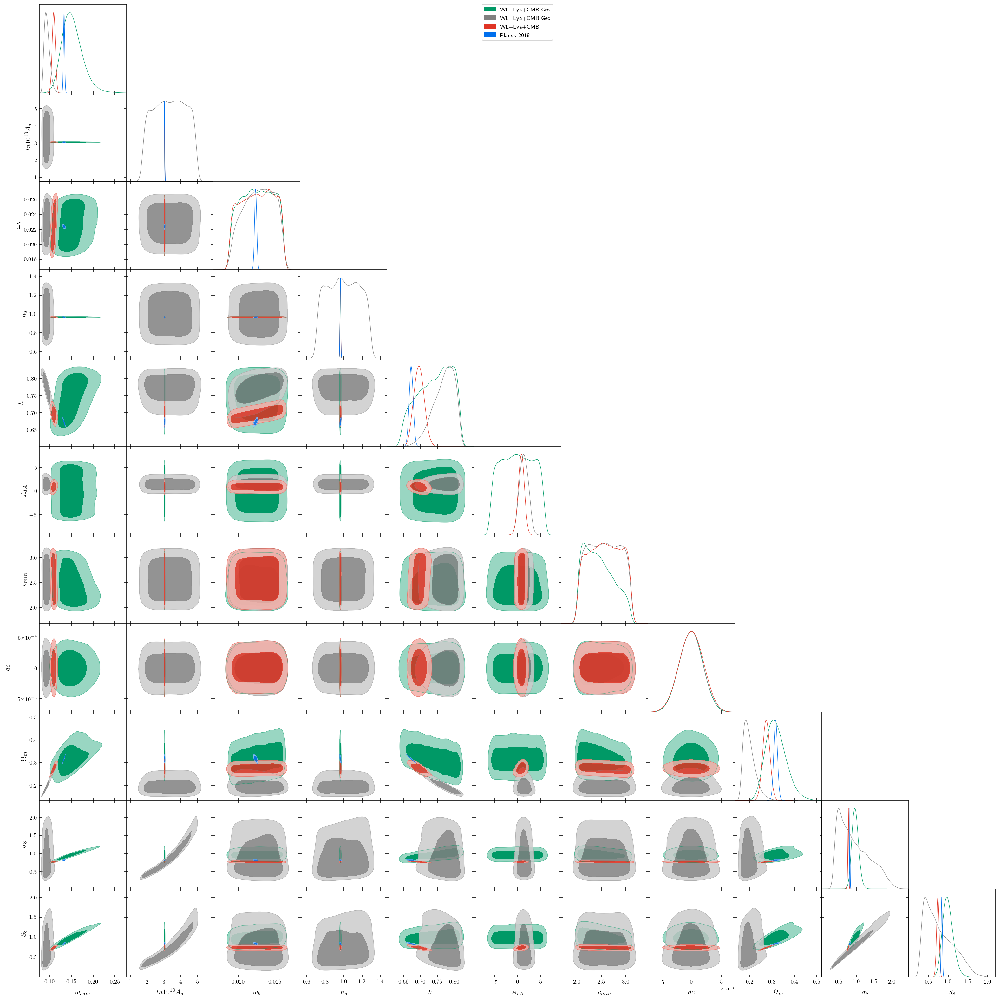

In [34]:
g = plots.getSubplotPlotter()
g.settings.axes_fontsize=12
g.triangle_plot([KV_lymcmb_gro_getdist, KV_lymcmb_geo_getdist, KV_lym_cmb_getdist, planck_getdist], filled=True)
#[ 'ln10^10A_s', 'n_s', 'h',  'Omega_m', 'sigma8', 'S8'],

In [35]:
g.plot_2d([KV_lymcmb_gro_getdist, KV_lymcmb_geo_getdist, KV_lym_cmb_getdist, planck_getdist], 'Omega_m', 'sigma8', filled=True, lims=[0.05, 0.8, 0.5, 1.8])
g.add_legend(['KV+Lym+CMB Gro', 'KV+Lym+CMB Geo', 'KV+Lym+CMB', 'P.18'], legend_loc='upper right');

In [36]:
g.plot_2d([KV_lymcmb_gro_getdist, KV_lymcmb_geo_getdist, KV_lym_cmb_getdist, planck_getdist],  'sigma8', 'S8', filled=True, lims=[0.4, 1.45, 0.5, 1.22])
g.add_legend(['KV+Lym+CMB Gro', 'KV+Lym+CMB Geo', 'KV+Lym+CMB', 'P.18'], legend_loc='upper left');

# KvSS

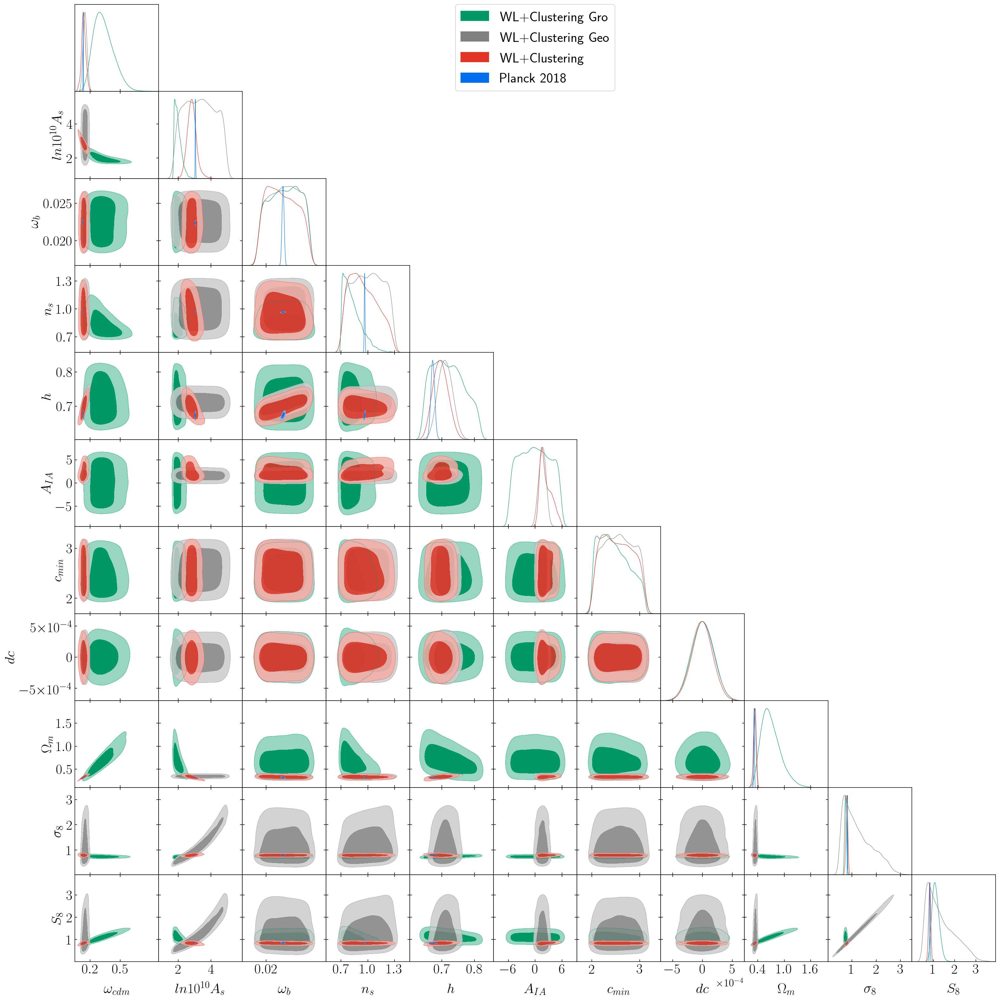

In [29]:
g = plots.getSubplotPlotter()
g.settings.axes_fontsize = 25
g.settings.legend_fontsize = 25
g.settings.axes_labelsize = 25
g.triangle_plot([  KVSS_mark3_gro_getdist, KVSS_mark3_geo_getdist, KVSS_getdist, planck_getdist], filled=True)
#[ 'ln10^10A_s', 'n_s', 'h',  'Omega_m', 'sigma8', 'S8'],

In [38]:
g.plot_2d([ KVSS_mark3_gro_getdist, KVSS_mark3_geo_getdist, KVSS_getdist, planck_getdist], 'Omega_m', 'sigma8', filled=True, lims=[0.2, .7, 0.5, 1])
g.add_legend([ 'KvSS Gro', 'KvSS Geo', 'KvSS', 'P.18'], legend_loc='upper right');

In [39]:
g.plot_2d([KV_getdist, BOSS_getdist, KVSS_getdist, planck_getdist], 'Omega_m', 'sigma8', filled=True, lims=[0.1, .5, 0.5, 1])
g.add_legend(['KV450', 'BOSS', 'KVSS', 'P.18'], legend_loc='upper right');

In [40]:
g.plot_2d([KVSS_mark3_gro_getdist, KVSS_mark3_geo_getdist, KVSS_getdist, planck_getdist], 'sigma8', 'S8', filled=True, lims=[0.6, 1.1, 0.55, 1.4])
g.add_legend(['KvSS Gro', 'KvSS Geo', 'KvSS', 'P.18'], legend_loc='upper right');

# KvSS + Lyman

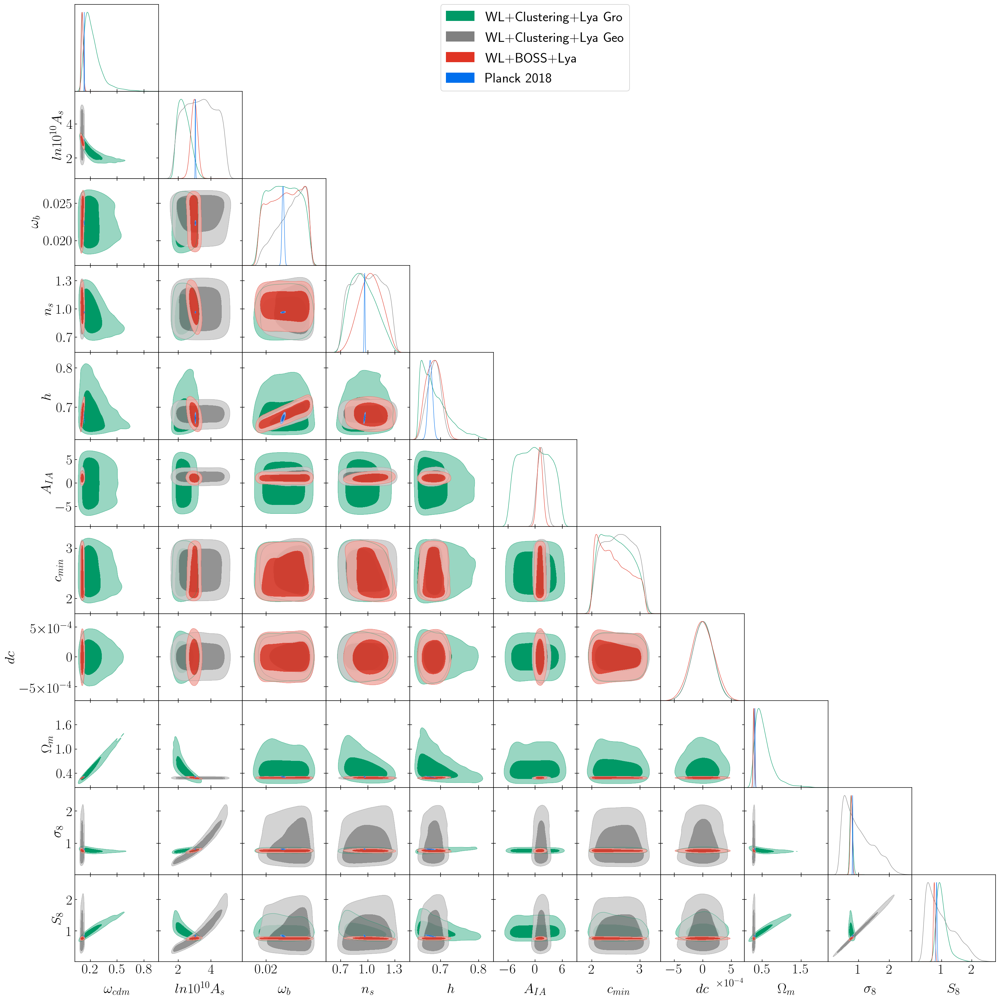

In [30]:
g = plots.getSubplotPlotter()
g.settings.axes_fontsize = 25
g.settings.legend_fontsize = 25
g.settings.axes_labelsize = 25
g.triangle_plot([KVSS_lym_mark3_gro_getdist, KVSS_lym_mark3_geo_getdist, KVSS_lym_getdist, planck_getdist],
                 filled=True)
#[ 'ln10^10A_s', 'n_s', 'h',  'Omega_m', 'sigma8', 'S8'],

In [42]:
g.plot_2d([KVSS_lym_mark3_gro_getdist, KVSS_lym_mark3_geo_getdist, KVSS_lym_getdist, planck_getdist], 'Omega_m', 'sigma8', filled=True, lims=[0.15, 0.5, 0.5, 1.1])
g.add_legend(['KvSS+lym Gro', 'KvSS+lym Geo', 'KvSS+lym', 'P.18'], legend_loc='upper right');

In [43]:
g.plot_2d([KVSS_lym_mark3_gro_getdist, KVSS_lym_mark3_geo_getdist, KVSS_lym_getdist, planck_getdist], 'sigma8', 'S8', filled=True, lims=[0.6, 1.1, 0.55, 1.4])
g.add_legend(['KvSS+lym Gro', 'KvSS+lym Geo', 'KvSS+lym', 'P.18'], legend_loc='upper right');

# KvSS + Lyman + CMB

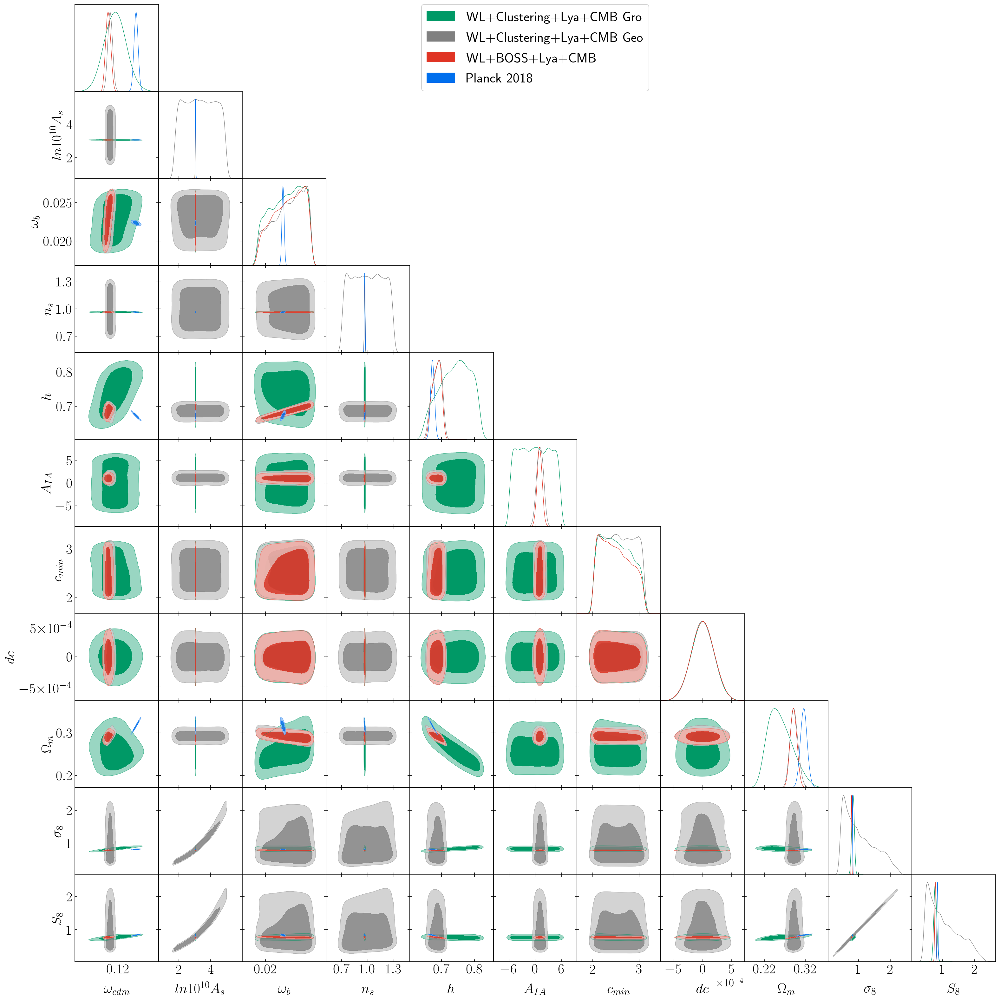

In [31]:
g = plots.getSubplotPlotter()
g.settings.axes_fontsize = 25
g.settings.legend_fontsize = 25
g.settings.axes_labelsize = 25
g.triangle_plot([KVSS_lym_CMB_mark3_gro_getdist, KVSS_lym_CMB_mark3_geo_getdist, KVSS_lym_cmb_getdist, planck_getdist], 
                 filled=True)
##[ 'ln10^10A_s', 'n_s', 'h',  'Omega_m', 'sigma8', 'S8'],

In [45]:
g.plot_2d([KVSS_lym_CMB_mark3_gro_getdist, KVSS_lym_CMB_mark3_geo_getdist, KVSS_lym_cmb_getdist, planck_getdist], 'Omega_m', 'sigma8', filled=True, lims=[0.15, 0.35, 0.5, 1.2])
g.add_legend(['KvSS+lym+CMB Gro', 'KvSS+lym+CMB Geo', 'KvSS+lym+CMB', 'P.18'], legend_loc='upper left');

In [46]:
g.plot_2d([KVSS_lym_CMB_mark3_gro_getdist, KVSS_lym_CMB_mark3_geo_getdist, KVSS_lym_cmb_getdist, planck_getdist], 'sigma8', 'S8', filled=True, lims=[0.65, 1., 0.55, 1.1])
g.add_legend(['KvSS+lym+CMB Gro', 'KvSS+lym+CMB Geo', 'KvSS+lym+CMB', 'P.18'], legend_loc='upper left');

## Comp Plots

In [23]:
lims2 =[0.05, .7, 0.63, .84]
lims3 =[-6, 6, 0.6, 1.5]
#g.settings.labels_size=16

<Figure size 432x324 with 0 Axes>

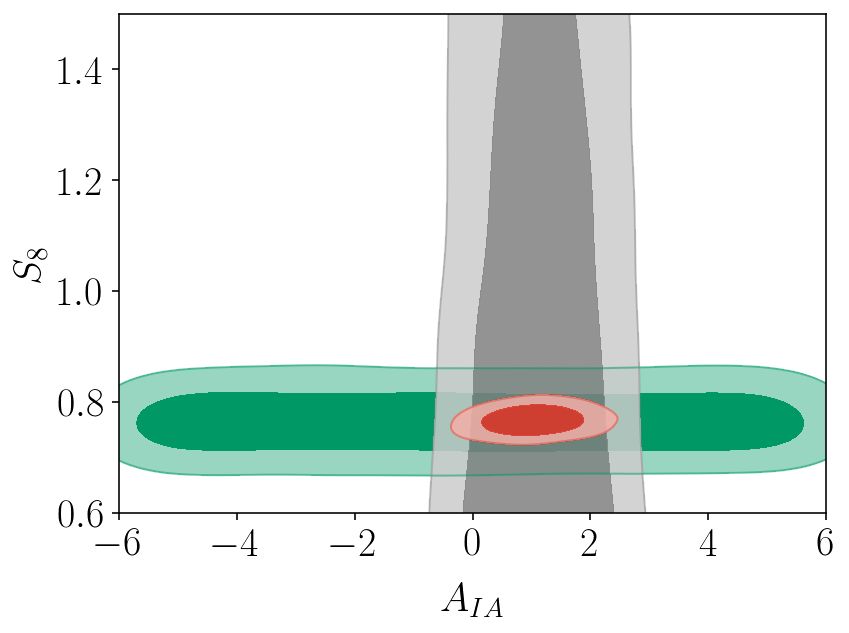

In [27]:
g = plots.get_single_plotter()
g.settings.axes_fontsize=20
g.settings.axes_labelsize = 20
g.plot_2d([KVSS_lym_CMB_mark3_gro_getdist, KVSS_lym_CMB_mark3_geo_getdist, KVSS_lym_cmb_getdist, planck_getdist], 'A_IA', 'S8', lims= lims3, filled=True);

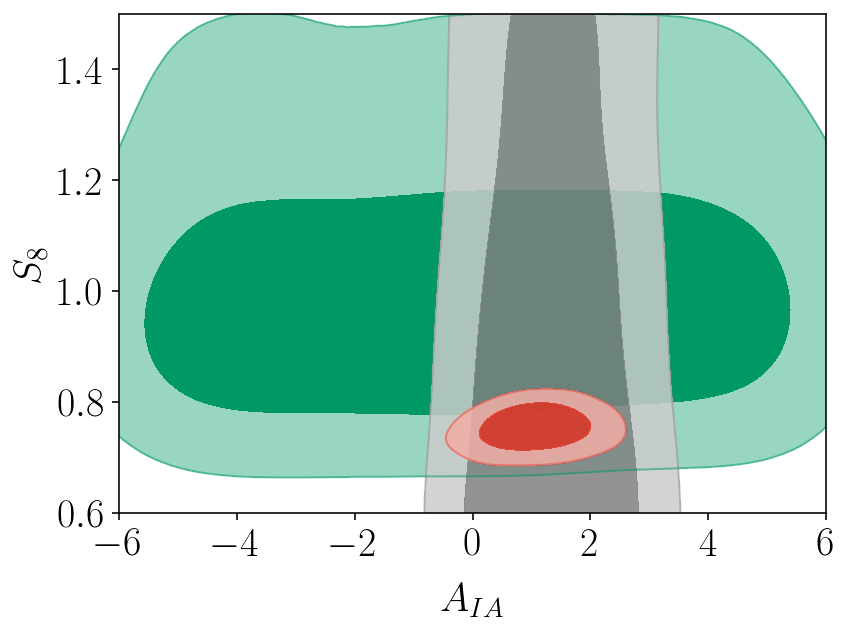

In [28]:
g = plots.get_single_plotter()
g.settings.axes_fontsize=20
g.settings.axes_labelsize = 20
g.plot_2d([KVSS_lym_mark3_gro_getdist, KVSS_lym_mark3_geo_getdist, KVSS_lym_getdist, planck_getdist],  'A_IA', 'S8', lims= lims3, filled=True);

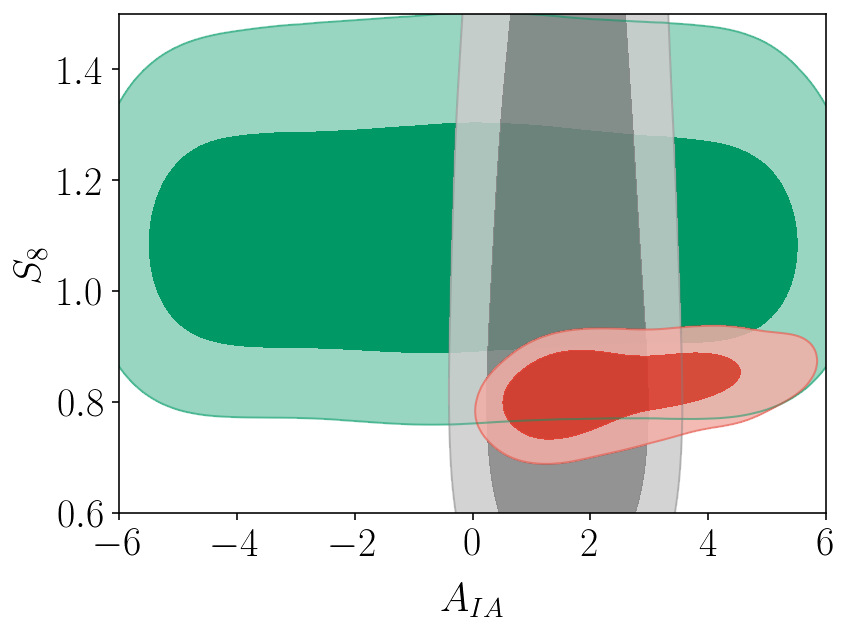

In [30]:
g = plots.get_single_plotter()
g.settings.axes_fontsize=20
g.settings.axes_labelsize = 20
g.plot_2d([KVSS_mark3_gro_getdist, KVSS_mark3_geo_getdist, KVSS_getdist, planck_getdist],  'A_IA', 'S8', lims= lims3, filled=True);

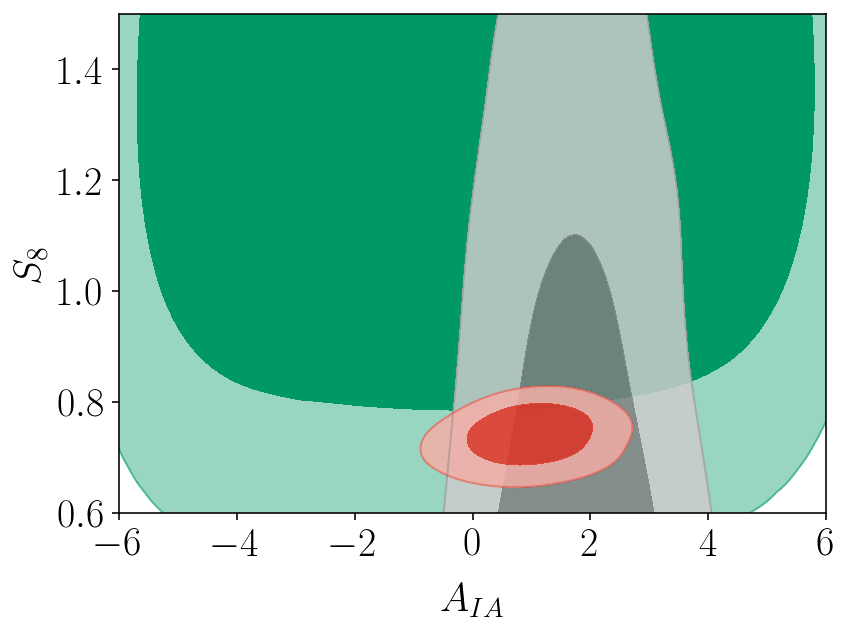

In [31]:
g = plots.get_single_plotter()
g.settings.axes_fontsize=20
g.settings.axes_labelsize = 20
g.plot_2d([KV_mark3_gro_getdist, KV_mark3_geo_getdist, KV_getdist, planck_getdist],  'A_IA', 'S8', lims= lims3, filled=True);

In [52]:
lims1 = [0.05, .7, 0.5, 1.3]

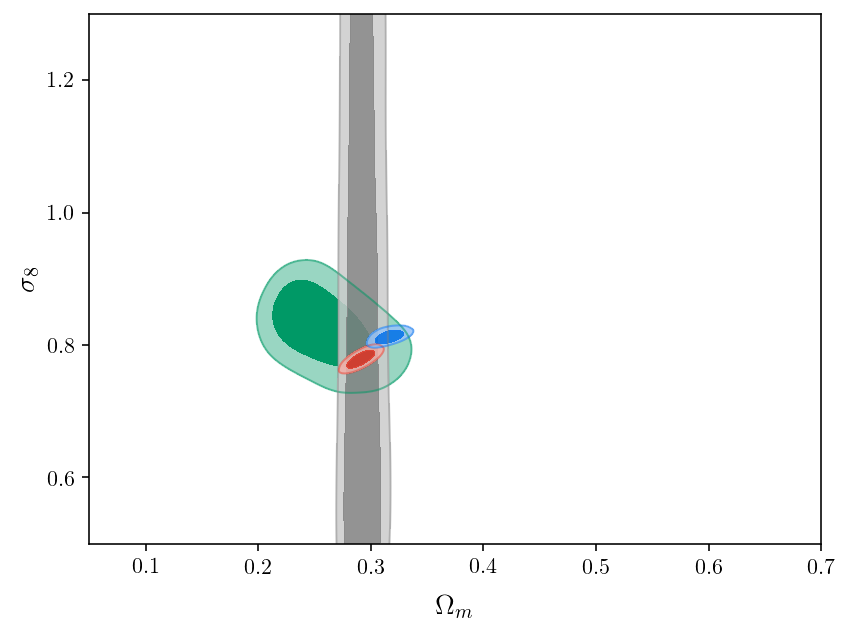

In [53]:
g = plots.get_single_plotter()
g.plot_2d([KVSS_lym_CMB_mark3_gro_getdist, KVSS_lym_CMB_mark3_geo_getdist, KVSS_lym_cmb_getdist, planck_getdist], 'Omega_m', 'sigma8', filled=True, lims=lims1);

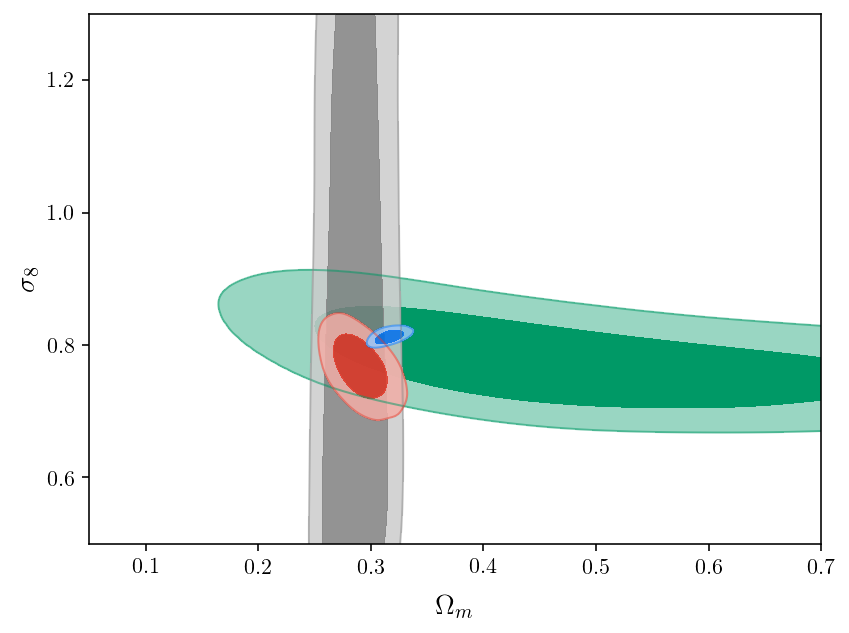

In [54]:
g = plots.get_single_plotter()
g.plot_2d([KVSS_lym_mark3_gro_getdist, KVSS_lym_mark3_geo_getdist, KVSS_lym_getdist, planck_getdist], 'Omega_m', 'sigma8', filled=True, lims=lims1);

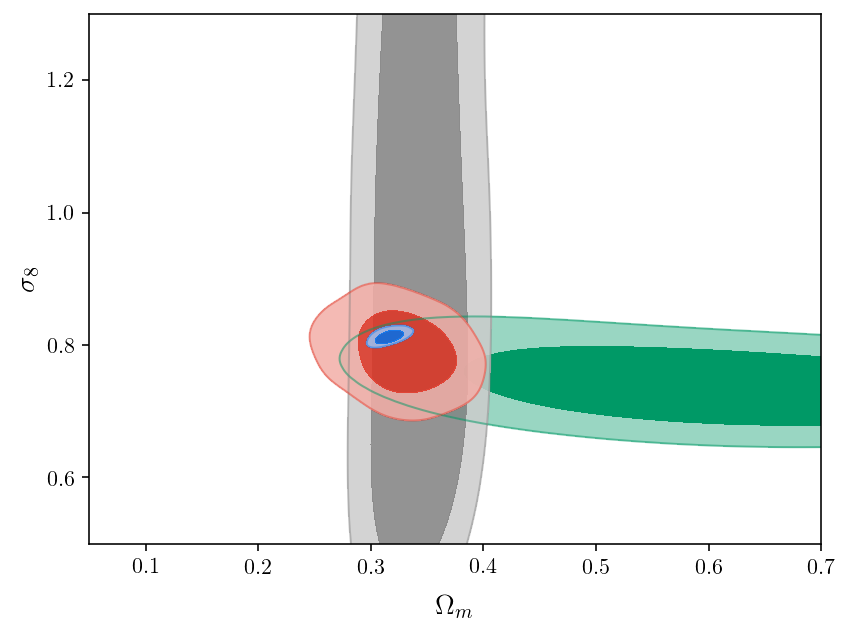

In [55]:
g = plots.get_single_plotter()
g.plot_2d([KVSS_mark3_gro_getdist, KVSS_mark3_geo_getdist, KVSS_getdist, planck_getdist], 'Omega_m', 'sigma8', filled=True, lims=lims1);

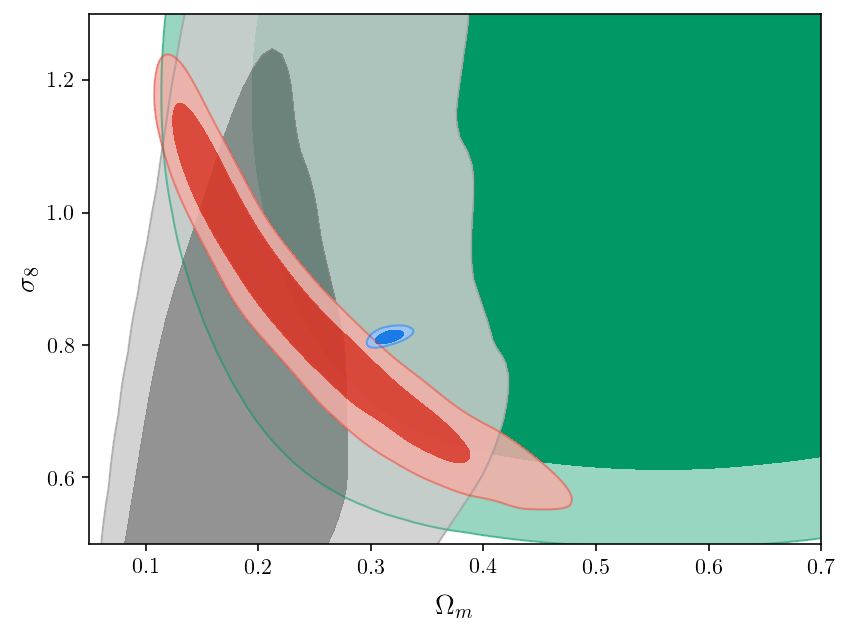

In [56]:
g = plots.get_single_plotter()
g.plot_2d([KV_mark3_gro_getdist, KV_mark3_geo_getdist, KV_getdist, planck_getdist], 'Omega_m', 'sigma8', filled=True, lims=lims1);

# Comp Plot 2 

In [57]:
limsh = [0.6, .85]
limsw = [0., .7]
limss = [0.2, 1.4]




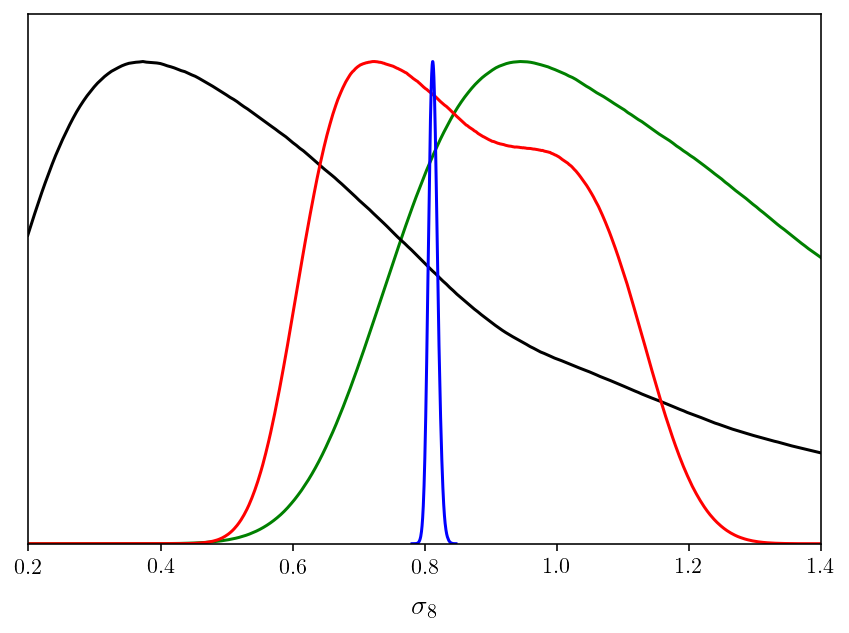

In [58]:
g = plots.get_single_plotter()
g.plot_1d([KV_mark3_gro_getdist, KV_mark3_geo_getdist, KV_getdist, planck_getdist], 'sigma8', lims=limss,         
line_args=[ {'lw':1.5, 'color':'green'}, {'lw':1.5, 'color':'black'},
               {'lw':1.5, 'color':'red'}, {'lw':1.5, 'color':'blue'}])

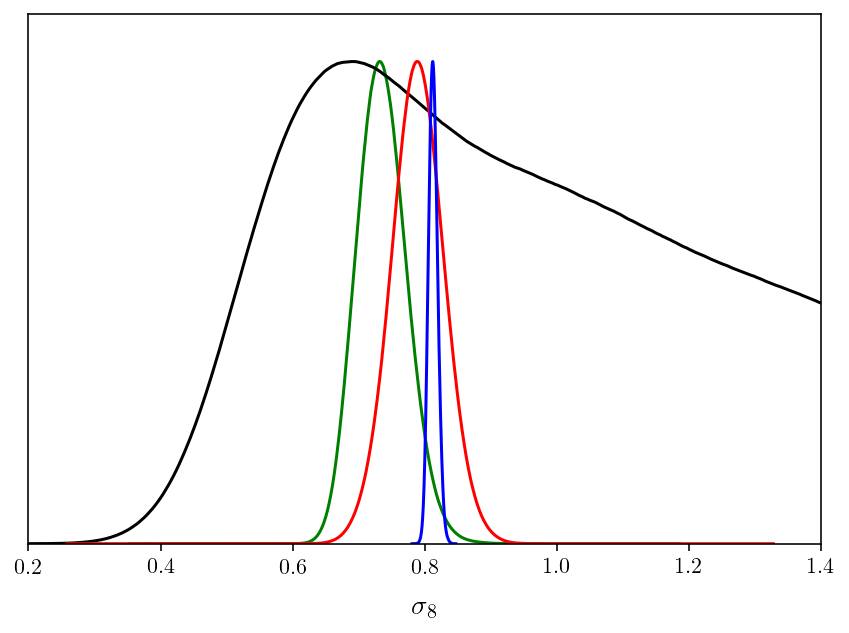

In [59]:
g = plots.get_single_plotter()
g.plot_1d([KVSS_mark3_gro_getdist, KVSS_mark3_geo_getdist, KVSS_getdist, planck_getdist], 'sigma8' ,lims=limss, 
         line_args=[ {'lw':1.5, 'color':'green'}, {'lw':1.5, 'color':'black'},
               {'lw':1.5, 'color':'red'}, {'lw':1.5, 'color':'blue'}])

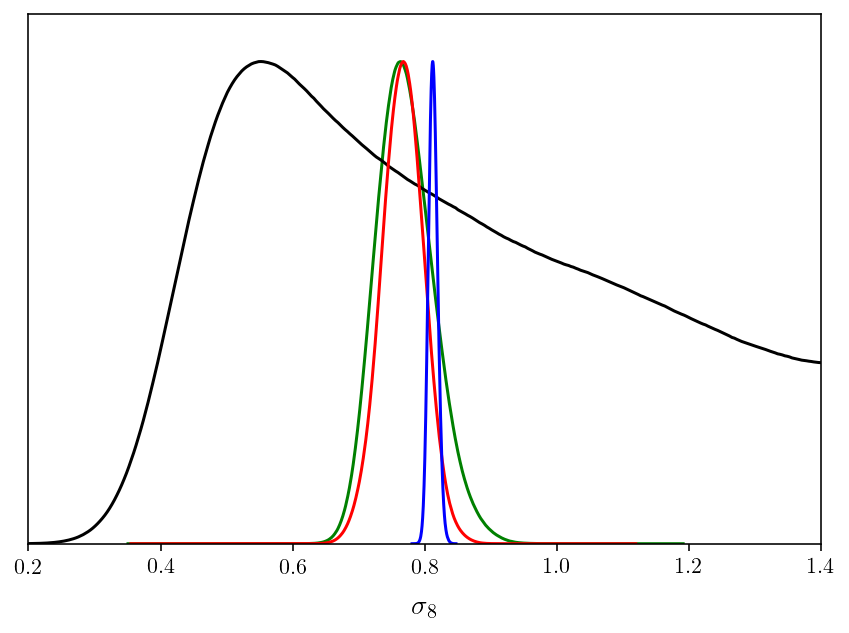

In [60]:
g = plots.get_single_plotter()
g.plot_1d([KVSS_lym_mark3_gro_getdist, KVSS_lym_mark3_geo_getdist, KVSS_lym_getdist, planck_getdist], 'sigma8' , lims=limss,
         line_args=[ {'lw':1.5, 'color':'green'}, {'lw':1.5, 'color':'black'},
               {'lw':1.5, 'color':'red'}, {'lw':1.5, 'color':'blue'}])

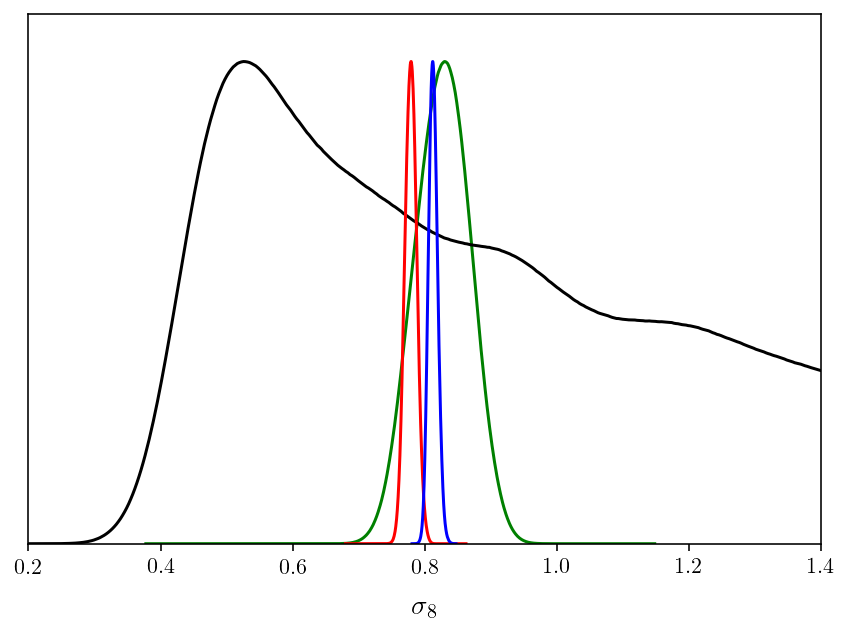

In [61]:
g = plots.get_single_plotter()
g.plot_1d([KVSS_lym_CMB_mark3_gro_getdist, KVSS_lym_CMB_mark3_geo_getdist, KVSS_lym_cmb_getdist, planck_getdist], 'sigma8', lims=limss, 
         line_args=[ {'lw':1.5, 'color':'green'}, {'lw':1.5, 'color':'black'},
               {'lw':1.5, 'color':'red'}, {'lw':1.5, 'color':'blue'}])